## PREDICTING THE RAINFALL OF A PARTICULAR LOCATION

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

**Reading the Dataset from the Excel file**

In [2]:
df = pd.read_excel('sydney_rain prediction.xlsx', header=0)

### *Performing Data Cleaning and Pre-Processing*

In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-02-01,Sydney,19.5,22.4,15.6,6.2,0.0,92.0,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,Yes,Yes
1,2008-02-02,Sydney,19.5,25.6,6.0,3.4,2.7,83.0,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,Yes,Yes
2,2008-02-03,Sydney,21.6,24.5,6.6,2.4,0.1,88.0,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,Yes,Yes
3,2008-02-04,Sydney,20.2,22.8,18.8,2.2,0.0,83.0,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,Yes,Yes
4,2008-02-05,Sydney,19.7,25.7,77.4,NaN,0.0,88.0,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,Yes,Yes


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3337 entries, 0 to 3336
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          3337 non-null   datetime64[ns]
 1   Location      3337 non-null   object        
 2   MinTemp       3334 non-null   float64       
 3   MaxTemp       3335 non-null   float64       
 4   Rainfall      3331 non-null   float64       
 5   Evaporation   3286 non-null   float64       
 6   Sunshine      3321 non-null   float64       
 7   Humidity9am   3323 non-null   float64       
 8   Humidity3pm   3324 non-null   float64       
 9   Pressure9am   3317 non-null   float64       
 10  Pressure3pm   3318 non-null   float64       
 11  Cloud9am      2771 non-null   float64       
 12  Cloud3pm      2776 non-null   float64       
 13  Temp9am       3333 non-null   float64       
 14  Temp3pm       3333 non-null   float64       
 15  RainToday     3331 non-null   object  

In [5]:
# There are some Null values found in the dataset
df.isnull().sum()

Date              0
Location          0
MinTemp           3
MaxTemp           2
Rainfall          6
Evaporation      51
Sunshine         16
Humidity9am      14
Humidity3pm      13
Pressure9am      20
Pressure3pm      19
Cloud9am        566
Cloud3pm        561
Temp9am           4
Temp3pm           4
RainToday         6
RainTomorrow      0
dtype: int64

In [6]:
df.describe()

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,3337,3334.000000,3335.000000,3331.000000,3286.000000,3321.000000,3323.000000,3324.000000,3317.000000,3318.000000,2771.000000,2776.000000,3333.000000,3333.000000
mean,2012-10-16 01:24:34.737788672,14.865057,23.002339,3.330231,5.187432,7.179374,68.229010,54.699158,1018.346156,1016.018774,4.181523,4.218660,17.819742,21.533333
min,2008-02-01 00:00:00,4.300000,11.700000,0.000000,0.000000,0.000000,19.000000,10.000000,986.700000,989.800000,0.000000,0.000000,6.400000,10.200000
25%,2010-05-15 00:00:00,11.000000,19.600000,0.000000,3.200000,4.300000,58.000000,44.000000,1013.700000,1011.300000,1.000000,1.000000,13.800000,18.400000
50%,2012-09-28 00:00:00,14.900000,22.800000,0.000000,4.800000,8.300000,69.000000,56.000000,1018.600000,1016.300000,5.000000,4.000000,18.200000,21.300000
75%,2015-03-14 00:00:00,18.700000,26.000000,1.400000,7.000000,10.200000,80.000000,65.000000,1023.100000,1020.800000,7.000000,7.000000,21.700000,24.500000
max,2017-06-25 00:00:00,27.600000,45.800000,119.400000,18.400000,13.600000,100.000000,99.000000,1039.000000,1036.700000,9.000000,8.000000,36.500000,44.700000
std,NaN,4.553641,4.494638,9.895172,2.777407,3.810886,15.085355,16.293530,7.021571,7.032211,2.749578,2.641885,4.897177,4.303737


In [7]:
df['Location'].value_counts()

Location
Sydney    3337
Name: count, dtype: int64

<Axes: xlabel='Location', ylabel='count'>

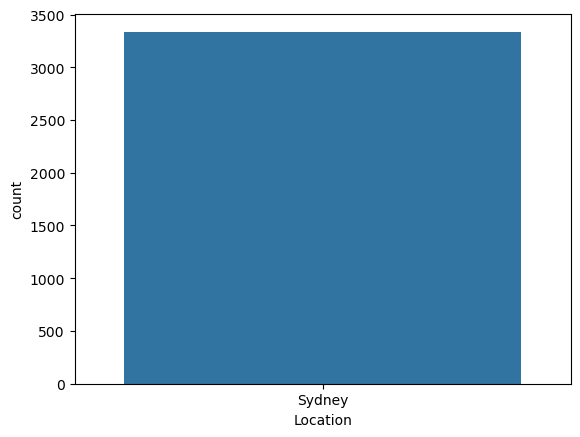

In [8]:
sns.countplot(x = 'Location', data=df)

**The variable location has the value which is 'Sydney' only and thus does not provide any value to the dataset.**

In [9]:
del df['Location']

In [10]:
df.head(100)

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-02-01,19.5,22.4,15.6,6.2,0.0,92.0,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,Yes,Yes
1,2008-02-02,19.5,25.6,6.0,3.4,2.7,83.0,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,Yes,Yes
2,2008-02-03,21.6,24.5,6.6,2.4,0.1,88.0,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,Yes,Yes
3,2008-02-04,20.2,22.8,18.8,2.2,0.0,83.0,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,Yes,Yes
4,2008-02-05,19.7,25.7,77.4,NaN,0.0,88.0,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,Yes,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2008-05-06,11.8,23.6,0.0,3.4,3.1,74.0,48.0,1017.1,1013.3,6.0,7.0,13.7,21.1,No,No
96,2008-05-07,13.0,23.0,0.0,3.6,9.4,57.0,44.0,1014.3,1011.8,1.0,3.0,16.5,22.0,No,No
97,2008-05-08,11.0,21.8,0.0,3.2,10.2,63.0,45.0,1019.2,1017.5,1.0,1.0,14.0,20.8,No,No
98,2008-05-09,11.0,21.9,0.0,3.2,10.1,75.0,60.0,1021.4,1020.2,0.0,1.0,14.3,20.6,No,No


#### Dealing with categorical values

In [11]:
# The variables 'Rain Today' and 'Rain Tomorrow' should be converted to numeric and null values should be treated.

<Axes: xlabel='RainToday', ylabel='count'>

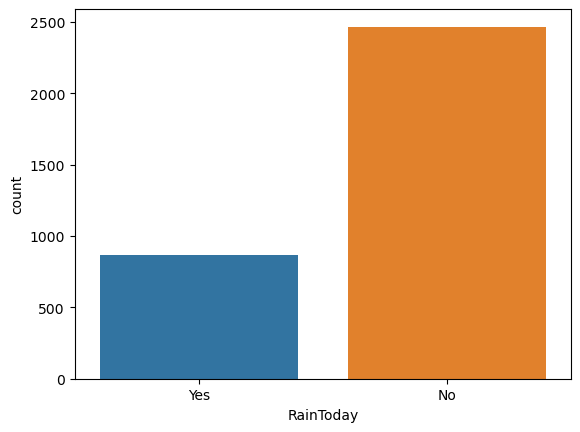

In [12]:
sns.countplot(x = 'RainToday', data=df)

In [13]:
# Sixe null values are found in the RainToday variable
df['RainToday'].isnull().sum()

6

<Axes: xlabel='RainTomorrow', ylabel='count'>

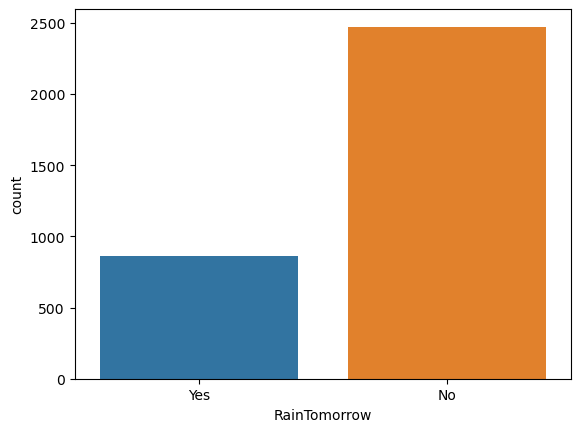

In [14]:
# The data is skewed.
sns.countplot(x = 'RainTomorrow', data=df)

In [15]:
df['RainTomorrow'].isnull().sum()

0

* The RainTomorrow variable is the Dependant variable which has to be predicted.
* There are few Null values in the RainToday variable which must be treated.
* The variables 'RainToday' and 'RainTomorrow' must be converted to numeric.

In [16]:
df.describe(include=[object])

,RainToday,RainTomorrow
count,3331,3337
unique,2,2
top,No,No
freq,2465,2472


In [17]:
# Converting Object datatype to Numeric
df['RainToday'].replace({'Yes': 1, 'No':0}, inplace = True)
df['RainTomorrow'].replace({'Yes': 1, 'No':0}, inplace = True)

In [18]:
df['RainToday'].value_counts()

RainToday
0.0    2465
1.0     866
Name: count, dtype: int64

In [19]:
df['RainTomorrow'].value_counts()

RainTomorrow
0    2472
1     865
Name: count, dtype: int64

In [20]:
df.columns

Index(['Date', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am',
       'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [21]:
# Checking for the number of Unique values for each variable.
for i in df.columns:
    print(i, ":" ,df[i].nunique())

Date : 3337
MinTemp : 205
MaxTemp : 249
Rainfall : 208
Evaporation : 84
Sunshine : 137
Humidity9am : 80
Humidity3pm : 86
Pressure9am : 362
Pressure3pm : 371
Cloud9am : 10
Cloud3pm : 9
Temp9am : 231
Temp3pm : 242
RainToday : 2
RainTomorrow : 2


### Missing values imputation

**Many variables have missing values and thus based on each variable's metadata, imputation is done**

In [22]:
df['MinTemp'].fillna(value=df['MinTemp'].median(), inplace=True)
df['MaxTemp'].fillna(value=df['MaxTemp'].median(), inplace=True)
df['Rainfall'].fillna(value=df['Rainfall'].median(), inplace=True)
df['Evaporation'].fillna(value=df['Evaporation'].median(), inplace=True)
df['Sunshine'].fillna(value=df['Sunshine'].median(), inplace=True)
df['Humidity9am'].fillna(value=df['Humidity9am'].median(), inplace=True)
df['Humidity3pm'].fillna(value=df['Humidity3pm'].median(), inplace=True)
df['Pressure9am'].fillna(value=df['Pressure9am'].median(), inplace=True)
df['Pressure3pm'].fillna(value=df['Pressure3pm'].median(), inplace=True)
df['Cloud9am'].fillna(value=df['Cloud9am'].mode()[0], inplace=True)
df['Cloud3pm'].fillna(value=df['Cloud3pm'].mode()[0], inplace=True)
df['Temp9am'].fillna(value=df['Temp9am'].median(), inplace=True)
df['Temp3pm'].fillna(value=df['Temp3pm'].median(), inplace=True)


In [23]:
# For the RainToday variable, we are removing the null values.
df.dropna(inplace=True)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3331 entries, 0 to 3336
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          3331 non-null   datetime64[ns]
 1   MinTemp       3331 non-null   float64       
 2   MaxTemp       3331 non-null   float64       
 3   Rainfall      3331 non-null   float64       
 4   Evaporation   3331 non-null   float64       
 5   Sunshine      3331 non-null   float64       
 6   Humidity9am   3331 non-null   float64       
 7   Humidity3pm   3331 non-null   float64       
 8   Pressure9am   3331 non-null   float64       
 9   Pressure3pm   3331 non-null   float64       
 10  Cloud9am      3331 non-null   float64       
 11  Cloud3pm      3331 non-null   float64       
 12  Temp9am       3331 non-null   float64       
 13  Temp3pm       3331 non-null   float64       
 14  RainToday     3331 non-null   float64       
 15  RainTomorrow  3331 non-null   int64        

### Checking for Any Outliers in the Dataset

<Axes: >

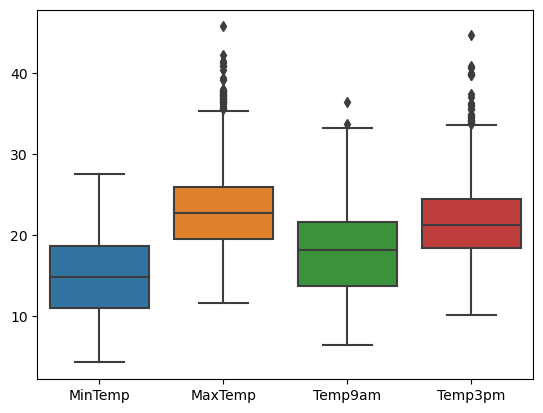

In [25]:
sns.boxplot(data = df[['MinTemp', 'MaxTemp', 'Temp9am', 'Temp3pm']])

<Axes: >

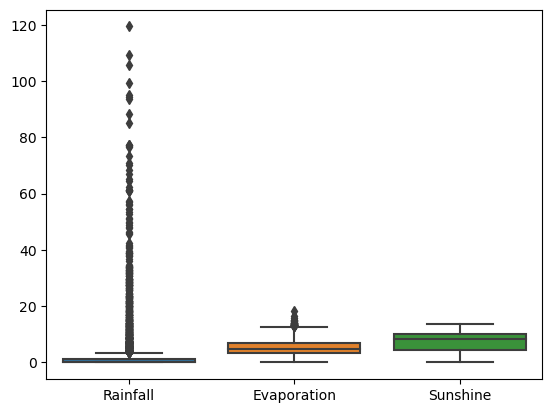

In [26]:
sns.boxplot(data = df[['Rainfall', 'Evaporation', 'Sunshine']])

<Axes: >

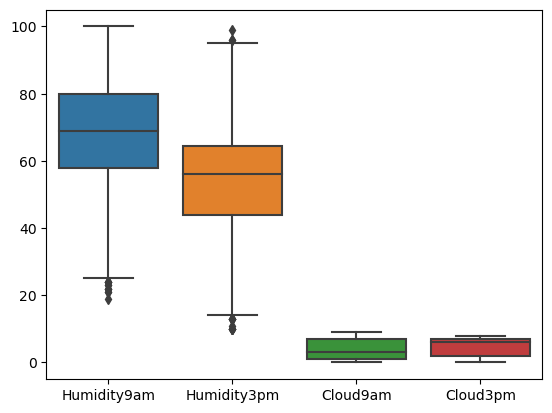

In [27]:
sns.boxplot(data = df[['Humidity9am', 'Humidity3pm', 'Cloud9am', 'Cloud3pm']])

<Axes: >

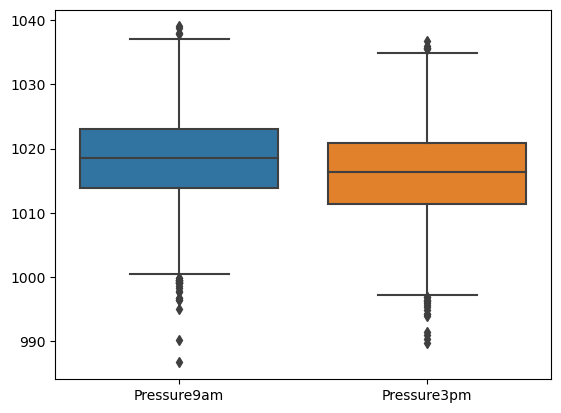

In [28]:
sns.boxplot(data=df[['Pressure9am', 'Pressure3pm']])

<Axes: >

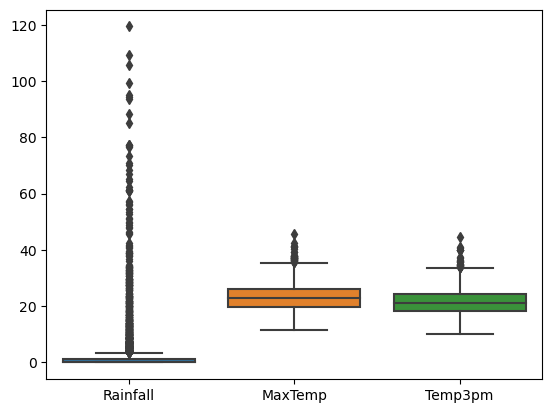

In [29]:
# Plot for variables which have suspected outliers.
sns.boxplot(data=df[['Rainfall', 'MaxTemp', 'Temp3pm']])

**OBSERVATIONS**
* Susptected Outliers are found in the Variables Rainfall, MaxTemp, Temp3pm
* Since temperatures and pressures can have wide ranges, the method of using 99 percentile and 1 percentile is used for
  outlier capping.

In [30]:
col_names = ['Rainfall', 'MaxTemp', 'Temp3pm']

In [31]:
for i in col_names:
    uv = np.percentile(df[i],[99])[0]
    df[i][(df[i]> 3*uv)]= 3*uv
    lv =  np.percentile(df[i],[1])[0]
    df[i][(df[i]<0.3*lv)] = 0.3*lv

C:\Users\aelen\AppData\Local\Temp\ipykernel_13612\11676320.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i][(df[i]> 3*uv)]= 3*uv
C:\Users\aelen\AppData\Local\Temp\ipykernel_13612\11676320.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i][(df[i]<0.3*lv)] = 0.3*lv
C:\Users\aelen\AppData\Local\Temp\ipykernel_13612\11676320.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i][(df[i]> 3*uv)]= 3*uv
C:\Users\aelen\AppDat

<Axes: >

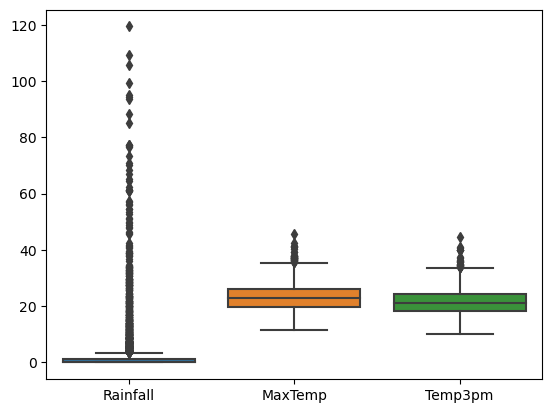

In [32]:
sns.boxplot(data=df[['Rainfall', 'MaxTemp', 'Temp3pm']])

**Seems like these suspected outliers were not actually outliers**.

**The Date variable has to be dealt with**.

In [33]:
# Splitting the Date variable to Day, Month and Year
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month
df['day'] = df['Date'].dt.day

In [34]:
del df['Date']

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3331 entries, 0 to 3336
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   MinTemp       3331 non-null   float64
 1   MaxTemp       3331 non-null   float64
 2   Rainfall      3331 non-null   float64
 3   Evaporation   3331 non-null   float64
 4   Sunshine      3331 non-null   float64
 5   Humidity9am   3331 non-null   float64
 6   Humidity3pm   3331 non-null   float64
 7   Pressure9am   3331 non-null   float64
 8   Pressure3pm   3331 non-null   float64
 9   Cloud9am      3331 non-null   float64
 10  Cloud3pm      3331 non-null   float64
 11  Temp9am       3331 non-null   float64
 12  Temp3pm       3331 non-null   float64
 13  RainToday     3331 non-null   float64
 14  RainTomorrow  3331 non-null   int64  
 15  year          3331 non-null   int32  
 16  month         3331 non-null   int32  
 17  day           3331 non-null   int32  
dtypes: float64(14), int32(3), int64(1

##### Checking the pattern of Rainfall with respect to the Dates

<Axes: xlabel='month', ylabel='RainTomorrow'>

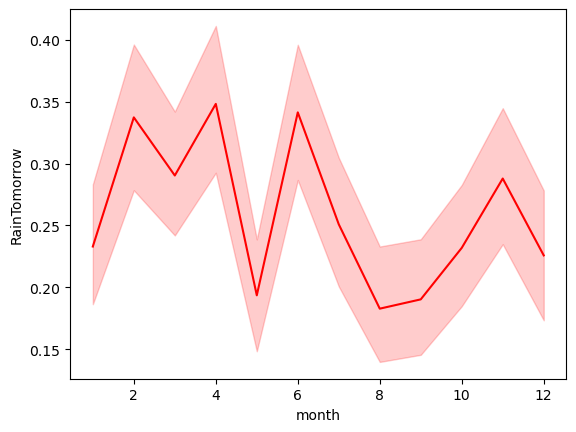

In [36]:
sns.lineplot(x='month',y='RainTomorrow',data=df, color='red')

<Axes: xlabel='year', ylabel='RainTomorrow'>

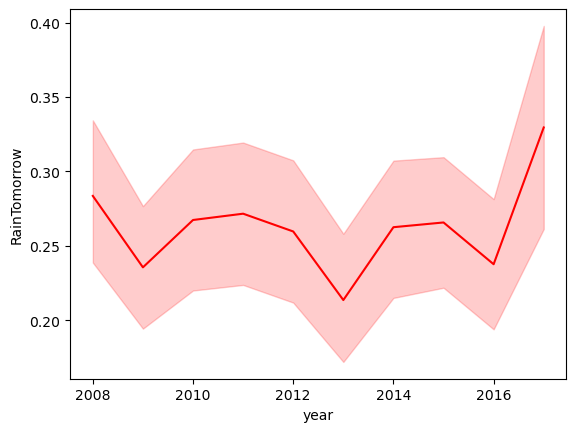

In [37]:
sns.lineplot(x='year',y='RainTomorrow',data=df, color='red')

<Axes: xlabel='day', ylabel='RainTomorrow'>

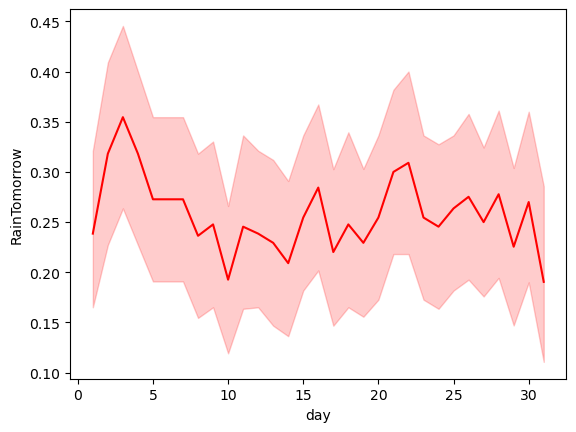

In [38]:
sns.lineplot(x='day',y='RainTomorrow',data=df, color='red')

<Axes: xlabel='Sunshine', ylabel='Evaporation'>

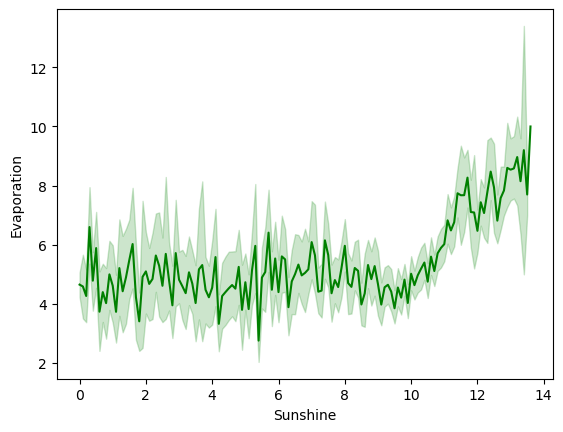

In [39]:
sns.lineplot(x='Sunshine',y='Evaporation',data=df, color='green')

<Axes: xlabel='Sunshine', ylabel='Rainfall'>

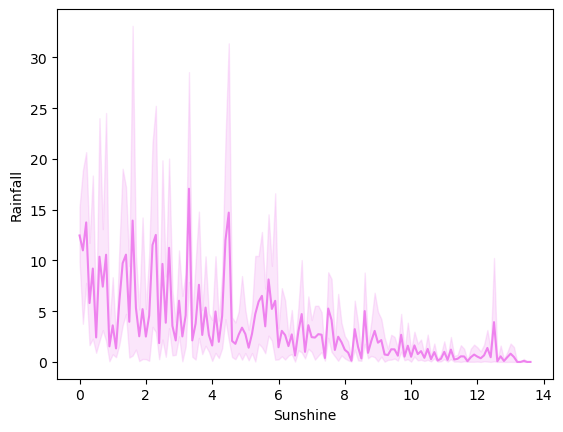

In [40]:
sns.lineplot(x='Sunshine',y='Rainfall',data=df, color='violet')

**OBSERVATIONS**
* Variables Sunshine and Evaporation are proportional
* Variables Sunshine and Rainfall are inversely proportional
* No specific pattern was found with respect to the dates

C:\Users\aelen\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


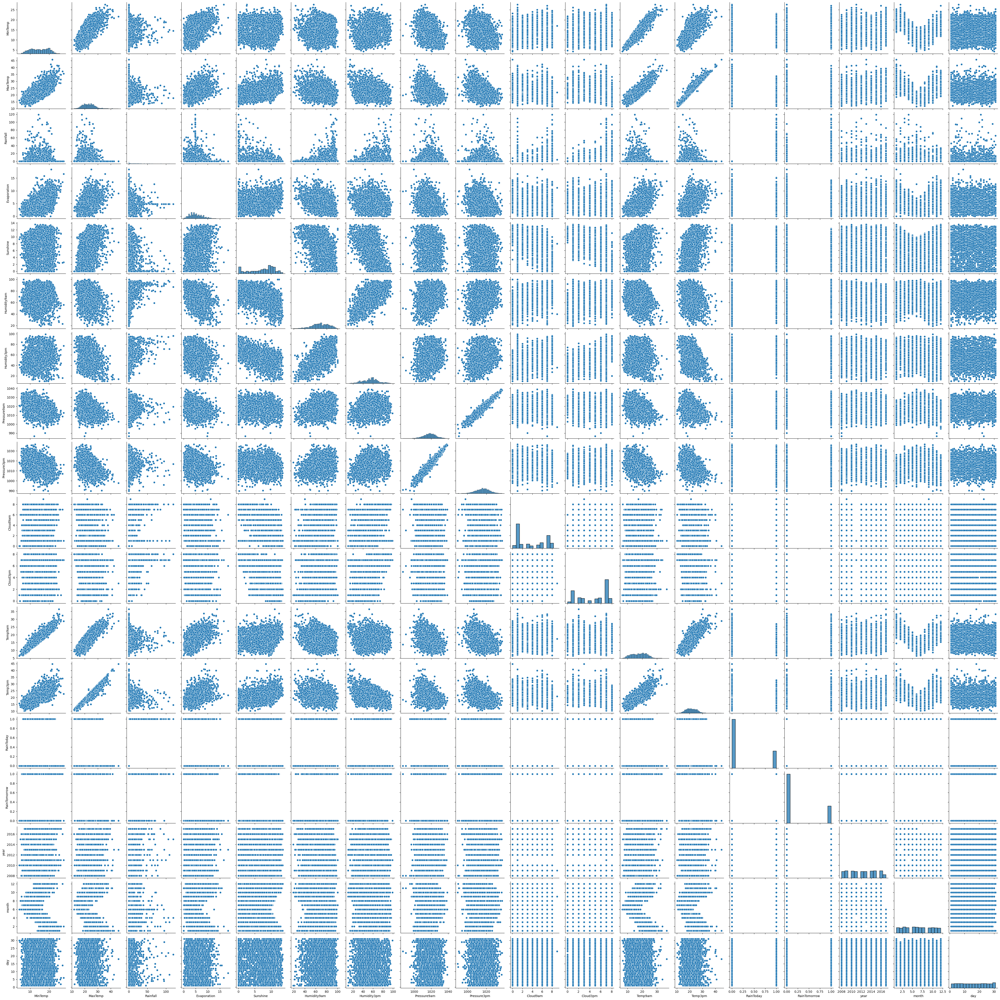

In [41]:
sns.pairplot(data=df, kind='scatter')

<Axes: >

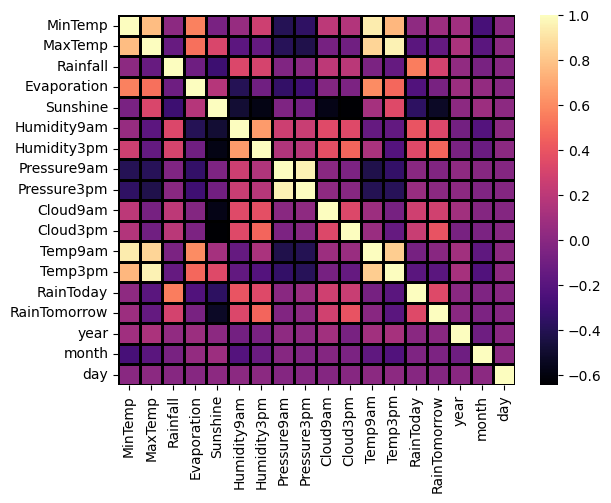

In [42]:
sns.heatmap(df.corr(), cmap='magma', linecolor='black', linewidths=1)

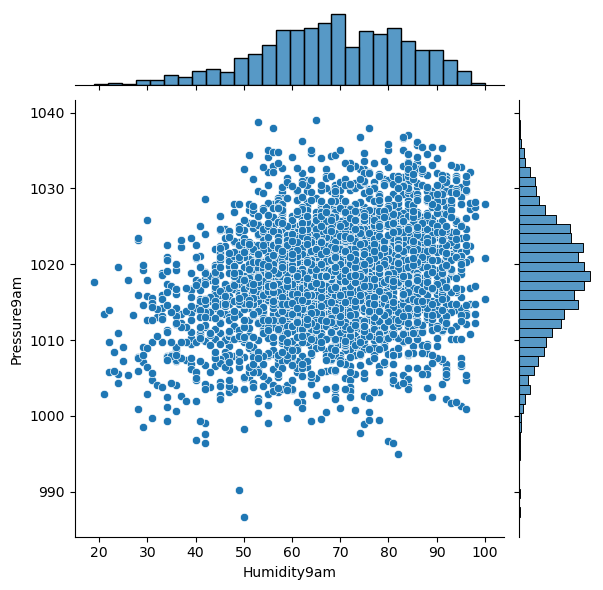

In [43]:
sns.jointplot(x="Humidity9am", y="Pressure9am", data=df)

<Axes: xlabel='Cloud9am', ylabel='Temp9am'>

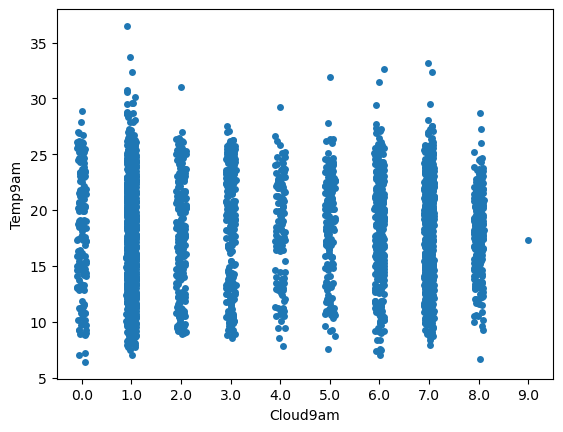

In [44]:
sns.stripplot(x="Cloud9am", y="Temp9am", data=df)

C:\Users\aelen\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


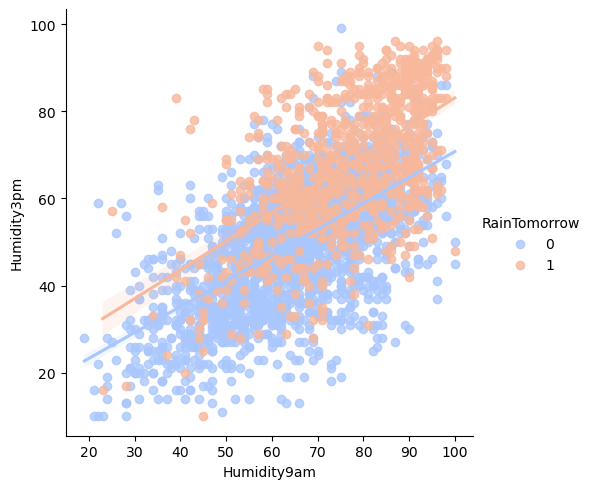

In [45]:
sns.lmplot(x="Humidity9am", y="Humidity3pm",hue='RainTomorrow',data=df, palette="coolwarm")

#### Now the Data seems to be ready for Modelling and thus using a basic Logistic Regression model.

In [46]:
import statsmodels.api as sn

In [47]:
X = df.drop(['RainTomorrow'], axis=1)

In [48]:
y = df['RainTomorrow']

In [49]:
X_c = sn.add_constant(X)

In [50]:
import statsmodels.discrete.discrete_model as sm

In [51]:
log_reg = sm.Logit(y, X_c).fit()

Optimization terminated successfully.
         Current function value: 0.381291
         Iterations 7


In [52]:
log_reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:           RainTomorrow   No. Observations:                 3331
Model:                          Logit   Df Residuals:                     3313
Method:                           MLE   Df Model:                           17
Date:                Wed, 18 Oct 2023   Pseudo R-squ.:                  0.3335
Time:                        20:04:45   Log-Likelihood:                -1270.1
converged:                       True   LL-Null:                       -1905.6
Covariance Type:            nonrobust   LLR p-value:                7.248e-260
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const         -53.3349     38.661     -1.380      0.168    -129.109      22.439
MinTemp        -0.2722      0.049     -5.563      0.000      -0.368      -0.176
MaxTemp         0.0829      0.044      1.898      0.058      -0.003       0.168
Rainfall        0.0088      0.007      1.357      0.175      -0.004       0.022
Evaporation     0.0680      0.026      2.623      0.009       0.017       0.119
Sunshine       -0.2159      0.023     -9.444      0.000      -0.261      -0.171
Humidity9am     0.0141      0.007      2.033      0.042       0.001       0.028
Humidity3pm     0.0530      0.007      7.687      0.000       0.039       0.066
Pressure9am    -0.1212      0.031     -3.865      0.000      -0.183      -0.060
Pressure3pm     0.0852      0.030      2.809      0.005       0.026       0.145
Cloud9am       -0.0097      0.022     -0.446      0.655      -0.052       0.033
Cloud3pm        0.1071      0.030      3.526      0.000       0.048       0.167
Temp9am         0.1620      0.052      3.108      0.002       0.060       0.264
Temp3pm        -0.0360      0.052     -0.696      0.486      -0.137       0.065
RainToday       0.6843      0.137      5.001      0.000       0.416       0.952
year            0.0425      0.019      2.223      0.026       0.005       0.080
month          -0.0145      0.017     -0.879      0.379      -0.047       0.018
day            -0.0037      0.006     -0.650      0.516      -0.015       0.007
===============================================================================
"""

* There are 11 variables out of 17 independant variables which have an impact over the dependant variable as per the p scores.

#### Splitting the Data and Standardizing the Values

In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

In [55]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(2331, 17) (1000, 17) (2331,) (1000,)


In [56]:
scaler = preprocessing.StandardScaler().fit(X_train)

In [57]:
X_train_s = scaler.transform(X_train)
X_test_s = scaler.transform(X_test)

In [58]:
log_reg_1 = LogisticRegression()

In [59]:
log_reg_1.fit(X_train_s, y_train)

LogisticRegression()

In [60]:
log_reg_1.coef_

array([[-1.23798707,  0.33740547,  0.15399814,  0.22477369, -0.80154469,
         0.16119634,  0.9829254 , -0.67821806,  0.38765983, -0.03269975,
         0.31864959,  0.73916725, -0.07566002,  0.27108325,  0.12838544,
        -0.0174686 , -0.01323499]])

In [61]:
log_reg_1.intercept_

array([-1.53236685])

In [62]:
y_train_p = log_reg_1.predict(X_train_s)

In [63]:
y_test_p = log_reg_1.predict(X_test_s)

In [64]:
confusion_matrix(y_train, y_train_p)

array([[1613,  108],
       [ 257,  353]], dtype=int64)

In [65]:
confusion_matrix(y_test, y_test_p)

array([[687,  60],
       [118, 135]], dtype=int64)

In [66]:
precision_score(y_test, y_test_p)

0.6923076923076923

In [67]:
recall_score(y_test, y_test_p)

0.5335968379446641

In [68]:
accuracy_score(y_train, y_train_p)

0.8434148434148434

In [69]:
accuracy_score(y_test, y_test_p)

0.822

In [70]:
roc_auc_score(y_test, y_test_p)

0.726637776402051

**OBSERVATIONS**
* The accuracy score for the Test and Train data seems good
* However, other classifier models are to be tried before coming to a conclusion 
* The data is now modelled using Decision Tree Classifier

### Decision Tree Classifier

In [71]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

In [72]:
dtc = DecisionTreeClassifier()

The data from the train, test split is being used here as well

In [73]:
dtc.fit(X_train_s, y_train)

DecisionTreeClassifier()

In [74]:
y_train_d = dtc.predict(X_train_s)
y_test_d = dtc.predict(X_test_s)

In [75]:
confusion_matrix(y_test, y_test_d)

array([[614, 133],
       [114, 139]], dtype=int64)

In [76]:
accuracy_score(y_train, y_train_d)

1.0

In [77]:
accuracy_score(y_test, y_test_d)

0.753

** RandomizedSearch CV is used for determining ideal model 
by giving the parameters**

In [78]:
from sklearn.model_selection import RandomizedSearchCV

In [79]:
# The values for the params have been determined arbitrarity
params = {
    'max_depth' : list(range(1,10)),
    'max_leaf_nodes' : list(range(2, 50)),
    'criterion' : ['gini', 'entropy'],
    'min_samples_split' : list(range(1,100)),
    'min_samples_leaf' : list(range(1, 100)),
    'min_impurity_decrease' : [0.0001, 0.001, 0.01, 0.1]
}

In [80]:
random_dtc = RandomizedSearchCV(dtc, params, cv = 5, verbose = 1)

In [81]:
random_dtc.fit(X_train_s, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8,
                                                      9],
                                        'max_leaf_nodes': [2, 3, 4, 5, 6, 7, 8,
                                                           9, 10, 11, 12, 13,
                                                           14, 15, 16, 17, 18,
                                                           19, 20, 21, 22, 23,
                                                           24, 25, 26, 27, 28,
                                                           29, 30, 31, ...],
                                        'min_impurity_decrease': [0.0001, 0.001,
                                                                  0.01, 0.1],
                                        'min_samples_leaf': [1, 2, 3, 4, 5, 6,
                                                             7, 8, 9, 10, 11,
                                                             12, 13, 14, 15, 16,
                                                             17, 18, 19, 20, 21,
                                                             22, 23, 24, 25, 26,
                                                             27, 28, 29, 30, ...],
                                        'min_samples_split': [1, 2, 3, 4, 5, 6,
                                                              7, 8, 9, 10, 11,
                                                              12, 13, 14, 15,
                                                              16, 17, 18, 19,
                                                              20, 21, 22, 23,
                                                              24, 25, 26, 27,
                                                              28, 29, 30, ...]},
                   verbose=1)

In [82]:
print(random_dtc.best_params_)

{'min_samples_split': 68, 'min_samples_leaf': 48, 'min_impurity_decrease': 0.0001, 'max_leaf_nodes': 37, 'max_depth': 5, 'criterion': 'gini'}


In [83]:
# Creating Decision Tree Model with best parameters
dtc_new = DecisionTreeClassifier(max_leaf_nodes=5, min_impurity_decrease = 0.0001,
                             criterion = 'gini', min_samples_leaf = 13, min_samples_split=64, max_depth=4)

In [84]:
dtc_new.fit(X_train_s, y_train)

DecisionTreeClassifier(max_depth=4, max_leaf_nodes=5,
                       min_impurity_decrease=0.0001, min_samples_leaf=13,
                       min_samples_split=64)

In [85]:
y_train_dt = dtc_new.predict(X_train_s)
y_test_dt = dtc_new.predict(X_test_s)

In [86]:
confusion_matrix(y_train, y_train_dt)

array([[1643,   78],
       [ 296,  314]], dtype=int64)

In [87]:
accuracy_score(y_train, y_train_dt)

0.8395538395538396

In [88]:
accuracy_score(y_test, y_test_dt)

0.826

#### The accuracy of this new Decision Tree Classifier model with parameters specified is more than the one with default parameters.

#### PLOTTING THE DECISION TREE

In [89]:
from IPython.display import Image
import pydotplus

In [90]:
dot_data = tree.export_graphviz(dtc, out_file=None, filled=True)


(process:36660): GLib-GIO-WARNING **: 20:04:50.313: Unexpectedly, UWP app `HaukeGtze.7-ZipFileManagerUnofficial_1.2201.1.0_x64__6bk20wvc8rfx2' (AUMId `HaukeGtze.7-ZipFileManagerUnofficial_6bk20wvc8rfx2!zFM.exe') supports 36 extensions but has no verbs

(process:36660): GLib-GIO-WARNING **: 20:04:50.542: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.8.0.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs

(process:36660): GLib-GIO-WARNING **: 20:04:50.546: Unexpectedly, UWP app `Microsoft.OutlookForWindows_1.2023.1004.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.OutlookForWindows_8wekyb3d8bbwe!Microsoft.OutlookforWindows') supports 1 extensions but has no verbs

(process:36660): GLib-GIO-WARNING **: 20:04:50.569: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2309.16.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs



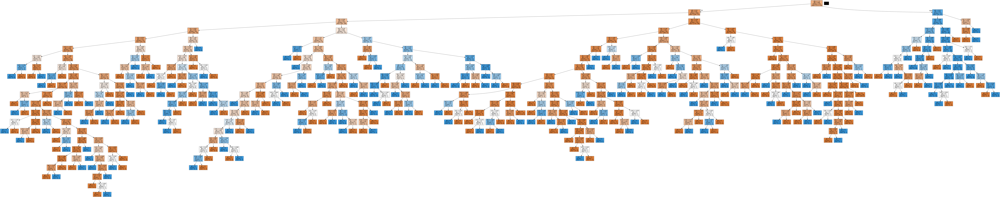

In [91]:
# This is the decision tree before specifying the best parameters
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [92]:
# The Decision tree plot after specifying the best parameters
dot_data = tree.export_graphviz(dtc_new, out_file=None, filled=True)

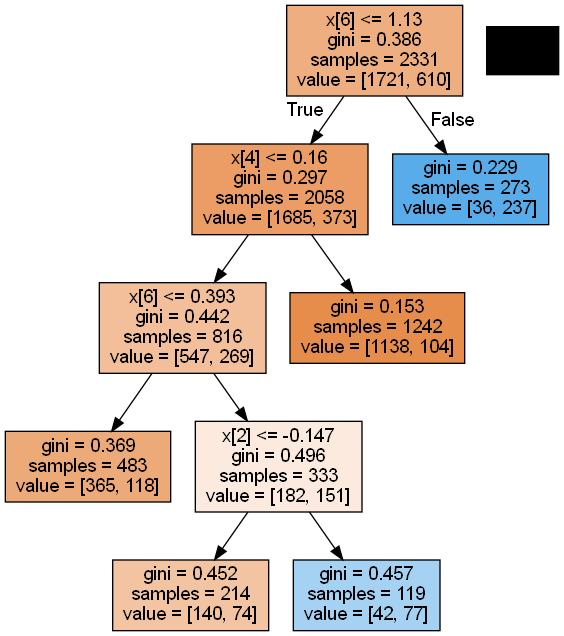

In [93]:
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

#### INTRODUCING BAGGING CLASSIFIER FOR THE DECISION TREE

In [94]:
from sklearn.ensemble import BaggingClassifier

In [95]:
bag_clf = BaggingClassifier(base_estimator = dtc, n_estimators=1000, bootstrap = True, n_jobs = 1, random_state=5)

In [96]:
bag_clf.fit(X_train_s, y_train)

C:\Users\aelen\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=1000,
                  n_jobs=1, random_state=5)

In [97]:
y_train_bc = bag_clf.predict(X_train_s)
y_test_bc = bag_clf.predict(X_test_s)

In [98]:
confusion_matrix(y_test, y_test_bc)

array([[698,  49],
       [124, 129]], dtype=int64)

In [99]:
accuracy_score(y_test, y_test_bc)

0.827

### ACCURACY SCORES SO FAR:

In [100]:
print("Accuracy of Logistic Regression model is :",accuracy_score(y_test, y_test_p))
print("Accuracy of Decision Tree Classifier model is :",accuracy_score(y_test, y_test_dt))
print("Accuracy of Decision Tree Classifier model with Bagging is :",accuracy_score(y_test, y_test_bc))

Accuracy of Logistic Regression model is : 0.822
Accuracy of Decision Tree Classifier model is : 0.826
Accuracy of Decision Tree Classifier model with Bagging is : 0.827


**Checking the data with Random Forest Classifier**

### RANDOM FOREST CLASSIFIER

In [101]:
from sklearn.ensemble import RandomForestClassifier

In [102]:
rfc=RandomForestClassifier()

In [103]:
rfc.fit(X_train_s,y_train)

RandomForestClassifier()

In [104]:
y_train_r = rfc.predict(X_train_s)
y_test_r = rfc.predict(X_test_s)

In [105]:
accuracy_score(y_test, y_test_r)

0.827

In [106]:
# Extracting important features
feature_imp = pd.Series(rfc.feature_importances_,index=X.columns).sort_values(ascending=False)
feature_imp

Humidity3pm    0.184760
Sunshine       0.155805
Humidity9am    0.066072
Rainfall       0.055325
Temp3pm        0.055317
Pressure3pm    0.050750
Pressure9am    0.050077
Cloud3pm       0.048576
MinTemp        0.048389
MaxTemp        0.047369
Temp9am        0.044987
Evaporation    0.044632
day            0.040267
Cloud9am       0.029283
year           0.028651
month          0.026643
RainToday      0.023097
dtype: float64

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


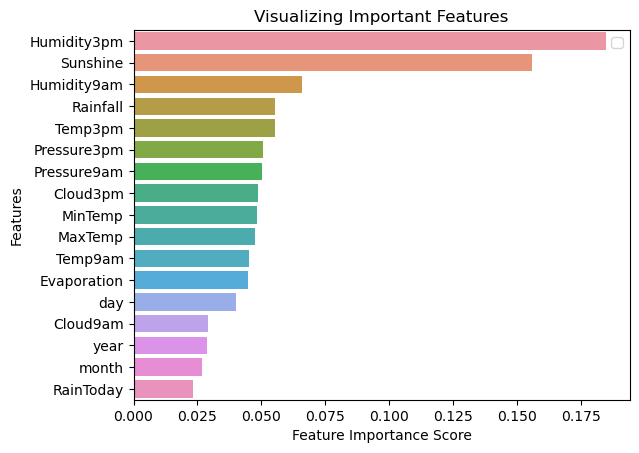

In [107]:
# Visualizing the Random Classfier
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Adding labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

**To fine tune the model, some features of least importance are being removed to check the accuracy again**

In [108]:
# Removing RainToday, Month and Year variables from the data and then running the model all over again
X_new = df.drop(['year', 'month', 'RainToday','RainTomorrow'], axis=1)

In [109]:
X_new.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,day
0,19.5,22.4,15.6,6.2,0.0,92.0,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,1
1,19.5,25.6,6.0,3.4,2.7,83.0,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,2
2,21.6,24.5,6.6,2.4,0.1,88.0,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,3
3,20.2,22.8,18.8,2.2,0.0,83.0,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,4
4,19.7,25.7,77.4,4.8,0.0,88.0,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,5


In [110]:
X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.2, random_state=5)

In [111]:
scaler = preprocessing.StandardScaler().fit(X_train)

In [112]:
rfc_n = RandomForestClassifier()

In [113]:
X_train_ns = scaler.transform(X_train)
X_test_ns = scaler.transform(X_test)

In [114]:
rfc_n.fit(X_train_ns,y_train)

RandomForestClassifier()

In [115]:
y_train_nr = rfc_n.predict(X_train_ns)
y_test_nr = rfc_n.predict(X_test_ns)

In [116]:
accuracy_score(y_test, y_test_nr)

0.8425787106446777

In [117]:
params_r = {
    'max_depth':list(range(1,10)),
    'n_estimators':list(range(10,5000,10)),
    'criterion' : ['gini', 'entropy'],
    'min_samples_split' : list(range(1,100)),
    'min_samples_leaf' : list(range(1, 100))
}

In [118]:
scaler = preprocessing.StandardScaler().fit(X_train)

In [119]:
X_train_ns = scaler.transform(X_train)
X_test_ns = scaler.transform(X_test)

In [120]:
rfc.fit(X_train_ns,y_train)

RandomForestClassifier()

In [121]:
random_rfc = RandomizedSearchCV(rfc, params_r, cv = 5, verbose = 1)

In [122]:
random_rfc.fit(X_train_ns, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8,
                                                      9],
                                        'min_samples_leaf': [1, 2, 3, 4, 5, 6,
                                                             7, 8, 9, 10, 11,
                                                             12, 13, 14, 15, 16,
                                                             17, 18, 19, 20, 21,
                                                             22, 23, 24, 25, 26,
                                                             27, 28, 29, 30, ...],
                                        'min_samples_split': [1, 2, 3, 4, 5, 6,
                                                              7, 8, 9, 10, 11,
                                                              12, 13, 14, 15,
                                                              16, 17, 18, 19,
                                                              20, 21, 22, 23,
                                                              24, 25, 26, 27,
                                                              28, 29, 30, ...],
                                        'n_estimators': [10, 20, 30, 40, 50, 60,
                                                         70, 80, 90, 100, 110,
                                                         120, 130, 140, 150,
                                                         160, 170, 180, 190,
                                                         200, 210, 220, 230,
                                                         240, 250, 260, 270,
                                                         280, 290, 300, ...]},
                   verbose=1)

In [123]:
print(random_rfc.best_params_)

{'n_estimators': 2750, 'min_samples_split': 98, 'min_samples_leaf': 64, 'max_depth': 5, 'criterion': 'gini'}


In [124]:
# Creating Ranfom Forest Model with best parameters
rfc_new = RandomForestClassifier(criterion = 'gini', min_samples_leaf = 3, min_samples_split=41, max_depth=8, n_estimators=1750)

In [125]:
rfc_new.fit(X_train_ns, y_train)

RandomForestClassifier(max_depth=8, min_samples_leaf=3, min_samples_split=41,
                       n_estimators=1750)

In [126]:
y_train_rfc = rfc_new.predict(X_train_ns)
y_test_rfc = rfc_new.predict(X_test_ns)

In [127]:
confusion_matrix(y_test, y_test_rfc)

array([[488,  20],
       [ 90,  69]], dtype=int64)

In [128]:
accuracy_score(y_test, y_test_rfc)

0.8350824587706147

In [129]:
accuracy_score(y_train, y_train_rfc)

0.8607357357357357

#### Trying other models to check whether the scores improve.
#### Using the training data where the three variables of least importance have been dropped.

### KNN Classifier

In [130]:
from sklearn.neighbors import KNeighborsClassifier
knn_c = KNeighborsClassifier()

In [131]:
knn_c.fit(X_train_ns, y_train)

KNeighborsClassifier()

In [132]:
y_train_knn = knn_c.predict(X_train_ns)
y_test_knn = knn_c.predict(X_test_ns)

In [133]:
accuracy_score(y_test, y_test_knn)

0.823088455772114

* The score of the KNN Classifer is attempted for improvement

In [134]:
from sklearn.model_selection import cross_val_score

In [135]:
# Using Cross_val_score for splitting the data and checking the accuracy
scores = cross_val_score(knn_c, X_new, y, cv=15, scoring='accuracy')
print(scores)

[0.83408072 0.82432432 0.78378378 0.77027027 0.76576577 0.84234234
 0.81531532 0.83333333 0.81531532 0.84234234 0.80630631 0.77477477
 0.80630631 0.81081081 0.79279279]


In [136]:
# Printing out the mean scores.
print(scores.mean())

0.8078576334181714


In [137]:
# Searching for an optimal value of K for KNN Classifier

# Defining the range of k from 1 to 50 to find the value of k with highest accuracy
k_range = range(1, 50) 

# List to store scores
k_scores = []

# Looping through values of k
for k in k_range:
    # Running KNeighborsClassifier with k neighbours
    knn_c = KNeighborsClassifier(n_neighbors=k)
    # Obtaining cross_val_score for KNeighborsClassifier with k neighbours
    scores = cross_val_score(knn_c, X_new, y, cv=15, scoring='accuracy')
    # Appending mean of scores for k neighbors to k_scores list
    k_scores.append(scores.mean())
print(k_scores)

[0.7520219771340847, 0.7916454571163093, 0.7847331636569306, 0.809360481557791, 0.8078576334181714, 0.8105616827589922, 0.8096594352199733, 0.814466933301014, 0.8144602001104244, 0.8171669427274809, 0.8240738496343879, 0.8204688993926663, 0.8252683176449994, 0.8234678624813154, 0.8237654695053799, 0.8228672618807148, 0.8213644137410954, 0.8234719023956693, 0.8240698097200341, 0.8258729581599538, 0.8264708654843186, 0.8285756608626563, 0.827973713623938, 0.8258756514361897, 0.8267738590608548, 0.8270768526373907, 0.8276747599617557, 0.8264762520367902, 0.8273744596614551, 0.8258756514361897, 0.8264722121224364, 0.8258756514361896, 0.8264722121224364, 0.8258729581599537, 0.8267725124227369, 0.8252737041974711, 0.8258729581599537, 0.8252710109212351, 0.8273731130233374, 0.8252750508355889, 0.8249707106209349, 0.8249734038971707, 0.826173258460254, 0.8258716115218356, 0.8258729581599537, 0.8243728032965699, 0.8258729581599537, 0.8252723575593529, 0.8249734038971707]


Text(0, 0.5, 'Cross-Validated Accuracy')

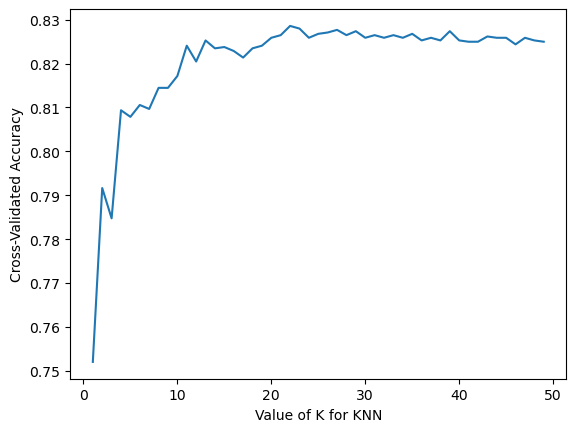

In [138]:
# Ploting the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(k_range, k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')


In [139]:
# From the above graph, for n_neighbors value 21, the score seems to be the highest 
knn_c = KNeighborsClassifier(n_neighbors=21)

knn_c.fit(X_train_ns, y_train)

KNeighborsClassifier(n_neighbors=21)

In [140]:
y_train_knn = knn_c.predict(X_train_ns)
y_test_knn = knn_c.predict(X_test_ns)

In [141]:
accuracy_score(y_test, y_test_knn)

0.8320839580209896

In [142]:
confusion_matrix(y_test, y_test_knn)

array([[485,  23],
       [ 89,  70]], dtype=int64)

#### Gradient Boosting Classifier

In [143]:
from sklearn.ensemble import GradientBoostingClassifier

In [144]:
gbc = GradientBoostingClassifier()

In [145]:
gbc.fit(X_train_ns, y_train)

GradientBoostingClassifier()

In [146]:
y_train_gb = gbc.predict(X_train_ns)
y_test_gb = gbc.predict(X_test_ns)

In [147]:
accuracy_score(y_test, y_test_gb)

0.8350824587706147

The score from Gradient Boosting technique is pretty good compared to the previous scores.
Defined parameters are given to see if the scores improve.

In [148]:
params_g = {
    'max_depth':list(range(1,10)),
    'n_estimators':list(range(10,5000,10)),
    'learning_rate': [0.01,0.001,0.2,0.02,0.002,1]
}

In [149]:
random_gbc = RandomizedSearchCV(gbc, params_g, cv = 5, verbose = 1)

In [150]:
random_gbc.fit(X_train_ns, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(),
                   param_distributions={'learning_rate': [0.01, 0.001, 0.2,
                                                          0.02, 0.002, 1],
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8,
                                                      9],
                                        'n_estimators': [10, 20, 30, 40, 50, 60,
                                                         70, 80, 90, 100, 110,
                                                         120, 130, 140, 150,
                                                         160, 170, 180, 190,
                                                         200, 210, 220, 230,
                                                         240, 250, 260, 270,
                                                         280, 290, 300, ...]},
                   verbose=1)

In [151]:
print(random_gbc.best_params_)

{'n_estimators': 750, 'max_depth': 4, 'learning_rate': 0.002}


In [152]:
gbc_new = GradientBoostingClassifier(max_depth=1, n_estimators=3890, learning_rate=0.001)

In [153]:
gbc_new.fit(X_train_ns, y_train)

GradientBoostingClassifier(learning_rate=0.001, max_depth=1, n_estimators=3890)

In [154]:
y_train_gbc = gbc_new.predict(X_train_ns)
y_test_gbc = gbc_new.predict(X_test_ns)

In [155]:
accuracy_score(y_test, y_test_gbc)

0.8320839580209896

#### Using random parameters in AdaBoost and XGBoost to check the scores

**ADA BOOST**

In [156]:
from sklearn.ensemble import AdaBoostClassifier

In [157]:
ada = AdaBoostClassifier(n_estimators=500, learning_rate=0.01)

In [158]:
ada.fit(X_train_ns, y_train)

AdaBoostClassifier(learning_rate=0.01, n_estimators=500)

In [159]:
y_train_ad = ada.predict(X_train_ns)
y_test_ad = ada.predict(X_test_ns)

In [160]:
accuracy_score(y_train, y_train_ad)

0.8374624624624625

In [161]:
accuracy_score(y_test, y_test_ad)

0.8290854572713643

**XG BOOST**

In [162]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

In [163]:
xgb_c = xgb.XGBClassifier(max_depth=5, n_estimators=10000, learning_rate=0.01,n_jobs=-1)

In [164]:
xgb_c.fit(X_train, y_train)
y_train_x = xgb_c.predict(X_train)
y_test_x = xgb_c.predict(X_test)

In [165]:
accuracy_score(y_test, y_test_x)

0.8290854572713643

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

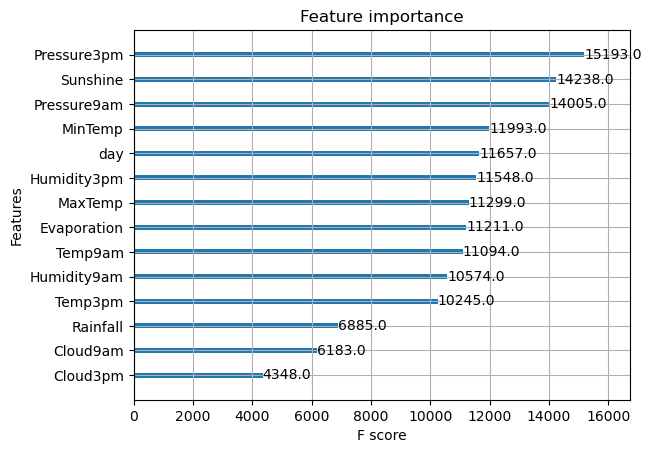

In [166]:
xgb.plot_importance(xgb_c)

In [167]:
params_x = {
 'max_depth':range(3,10,2),
    'gamma' : [0.1,0.2,0.3],
    'subsample':[0.8,0.9],
    'colsample_bytree':[0.8,0.9],
    'reg_alpha':[ 1e-2, 0.1, 1]
}

In [168]:
grid_cv = GridSearchCV(xgb_c, params_x,n_jobs=-1, cv=5, scoring='accuracy')

In [169]:
xgb_cn = xgb.XGBClassifier(colsample_bytree=0.8, gamma=0.2, max_depth=5, reg_alpha =1, subsample = 0.8)

In [170]:
xgb_cn.fit(X_train, y_train)
y_train_xn = xgb_cn.predict(X_train)
y_test_xn = xgb_cn.predict(X_test)

In [171]:
accuracy_score(y_test, y_test_xn)

0.8335832083958021

### COMPARISON OF ALL THE ACCURACY SCORES

**ACCURACY SCORES:**

In [172]:
print("Accuracy of Random Forest Classifier model is :",accuracy_score(y_test, y_test_rfc))
print("Accuracy of K Nearest Neighbors Classification model is :",accuracy_score(y_test, y_test_knn))
print("Accuracy of Gradient Boosting Classifier is :",accuracy_score(y_test, y_test_gb))
print("Accuracy of Adaboost model is :",accuracy_score(y_test, y_test_ad))
print("Accuracy of XG Boost model is :",accuracy_score(y_test, y_test_xn))

Accuracy of Random Forest Classifier model is : 0.8350824587706147
Accuracy of K Nearest Neighbors Classification model is : 0.8320839580209896
Accuracy of Gradient Boosting Classifier is : 0.8350824587706147
Accuracy of Adaboost model is : 0.8290854572713643
Accuracy of XG Boost model is : 0.8335832083958021


**CONFUSION MATRIX VISUALIZATION OF THE BEST FITTING MODEL**

Predicted    0   1
Actual            
0          488  20
1           90  69


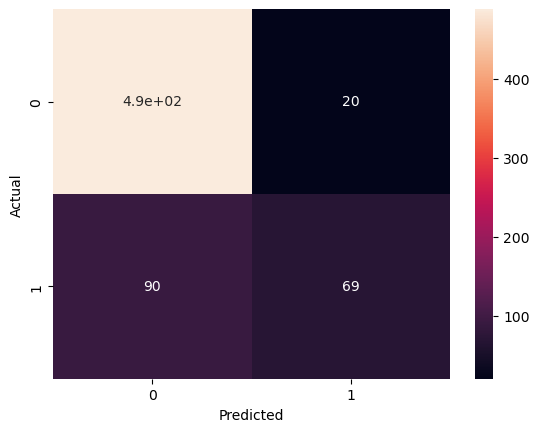

In [174]:
confusion_matrix = pd.crosstab(y_test, y_test_rfc, rownames=['Actual'], colnames=['Predicted'])
print(confusion_matrix)
sns.heatmap(confusion_matrix, annot=True)
plt.show()

### FROM THE SCORES, THE RANDOM FOREST CLASSIFIER SEEMS TO BE THE BEST FIT MODEL. 
